# Computer Vision Project 3: Inpainting of images using deep learning
Pixel Finders
Krzysztof Weber 151934
Adam Mielniczuk 151928

## Links
github: https://github.com/adammielniczuk/inpainting

dataset: https://www.kaggle.com/datasets/alessiocorrado99/animals10?rvi=1

## Problem 
We decided to solve the problem of image inpainting. We have chosen the problem as it is more challenging than basic classification but it is easy to obtain large amounts of data because every image after some processing can be used for the task. The problem is to recreate part cut from the original image based on the rest of that image.

## Dataset

We decided to use animals-10 dataset from Kaggle. The dataset was originally designed for classification task. It contains images of 10 different species of animals. The set was ideal for our project because it contained samples with similar visual characteristics across all instances and a considerable number of samples. Overall there were 26179 records in the dataset. 

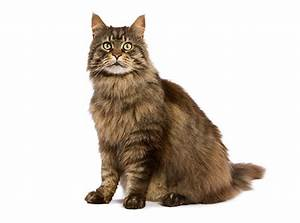

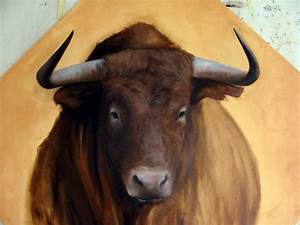

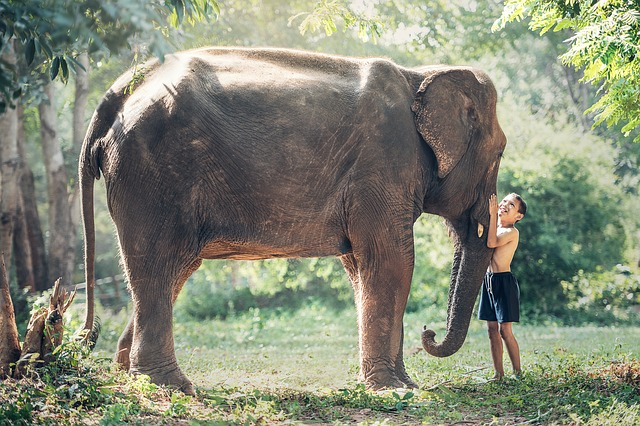


### Preprocessing

#### 1) images sizes
The images were of many different sizes. There were more than 1000 distinctive sizes of the images. Among those some did not meet the requirement of the image to be at least 200x200. After filtering those out we were left with 15002 witch we scaled to the size of 256x256 by adding padding or cutting the edges of the objects.


In [25]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

def count_images_by_size(directory):
    image_sizes = {}

    for root, dirs, files in os.walk(directory):
        for file in files:
            file_path = os.path.join(root, file)

            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
                with Image.open(file_path) as img:
                    size = img.size
                if size in image_sizes:
                    image_sizes[size] += 1
                else:
                    image_sizes[size] = 1

    return image_sizes

directory_path = 'raw-img'
result = count_images_by_size(directory_path)




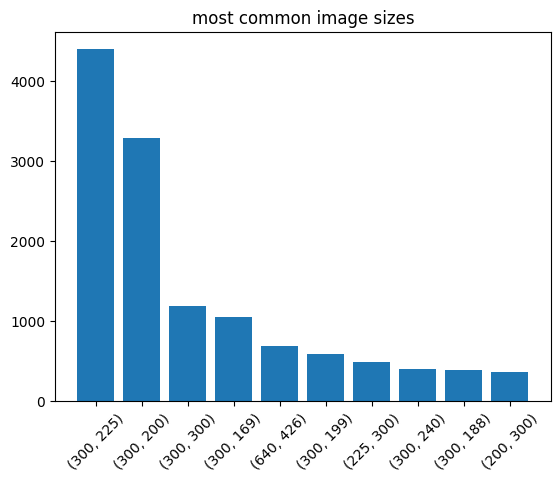

In [38]:
sizes = list(result.keys())
counts = np.array([result[size] for size in sizes])
sizes = np.array([str(size) for size in sizes])
order = np.argsort(-counts)
plt.bar(sizes[order][:10], counts[order][:10])
plt.xticks(rotation=45)
plt.title('most common image sizes')
plt.show()

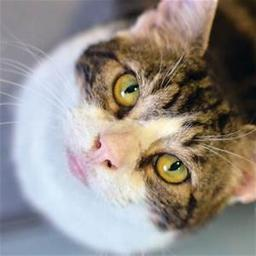
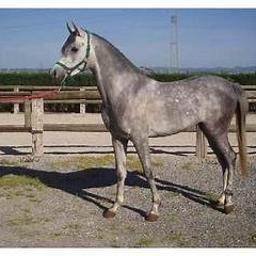
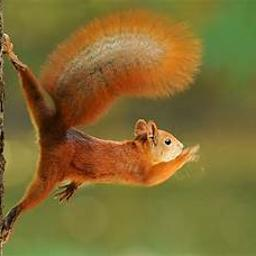

### 2) Train test split
We have split the scaled images into the training set with 13505 examples ans testing set with 1497 examples.

### 3) Defining an inpainting area.
For our example the area our algorithms were supposed to inpaint was the 32x32 square cut from the middle of the picture this operation however was often handled on the training phase during batch generation for the model.

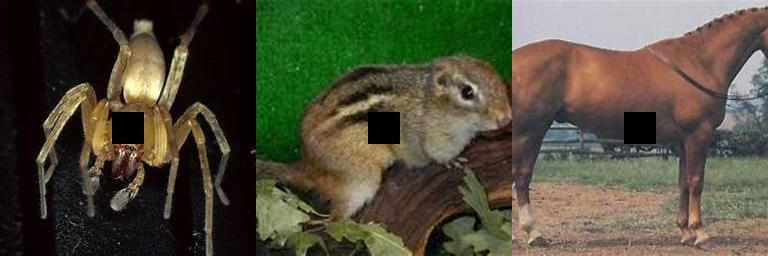

In [16]:
import cv2
import os
import numpy as np
from PIL import Image

def imshow(img):
        img = img.clip(0, 255).astype("uint8")
        if img.ndim == 3:
            if img.shape[2] == 4:
                img = cv2.cvtColor(img, cv2.COLOR_BGRA2RGBA)
            else:
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        display(Image.fromarray(img))

images = os.listdir('images/test')
np.random.seed(42)
examples = np.random.choice(images, 3)
imgs = list()
for example in examples:
    img = cv2.imread(os.path.join('images/test', example))
    img[112:144, 112:144] = 0
    imgs.append(img)

imshow(np.concatenate(imgs, 1))

## Used architectures
#### Simple model
We started by creating a simple model consisting of 4 convolutional layers followed by 1 dense layer and 2 transposed convolutional layers. The model was to output a prediction for 32x32 patch only and was trained with L2 loss. This was predicted to lead to blurry, deterministic results but was a good reference point for the next architectures.

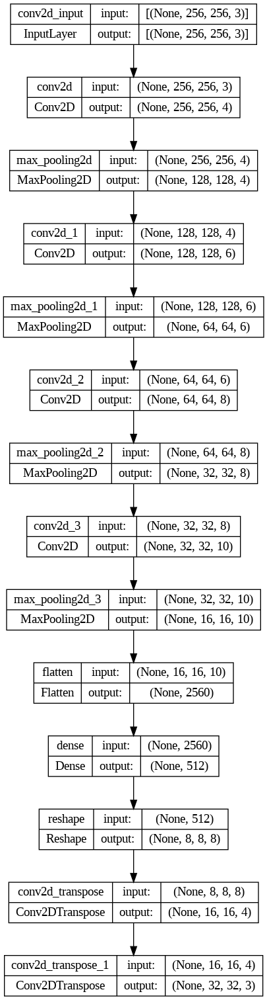

#### GAN

To better handle the problem of image inpainting we decided to use GAN architecture, so that the outputs of the model will no longer be deterministic. The architecture is a conditional GAN meaning it recives both random noise and the input of the original image with the cut middle part. This first architecture is based on the project from github: https://github.com/fqhd/Inpainting but was trained on our own data from scratch. This is a stack of convolutional layers first shrinking the input to then expand it. We can then treat it as an autoencoder. The discriminator is the stack of the convolutional layers with the single sigmoid activation function at the end.

##### Generator
![Bez nazwy.png](<attachment:Bez nazwy.png>)
##### Discriminator
![Bez nazwy-2.png](<attachment:Bez nazwy-2.png>)
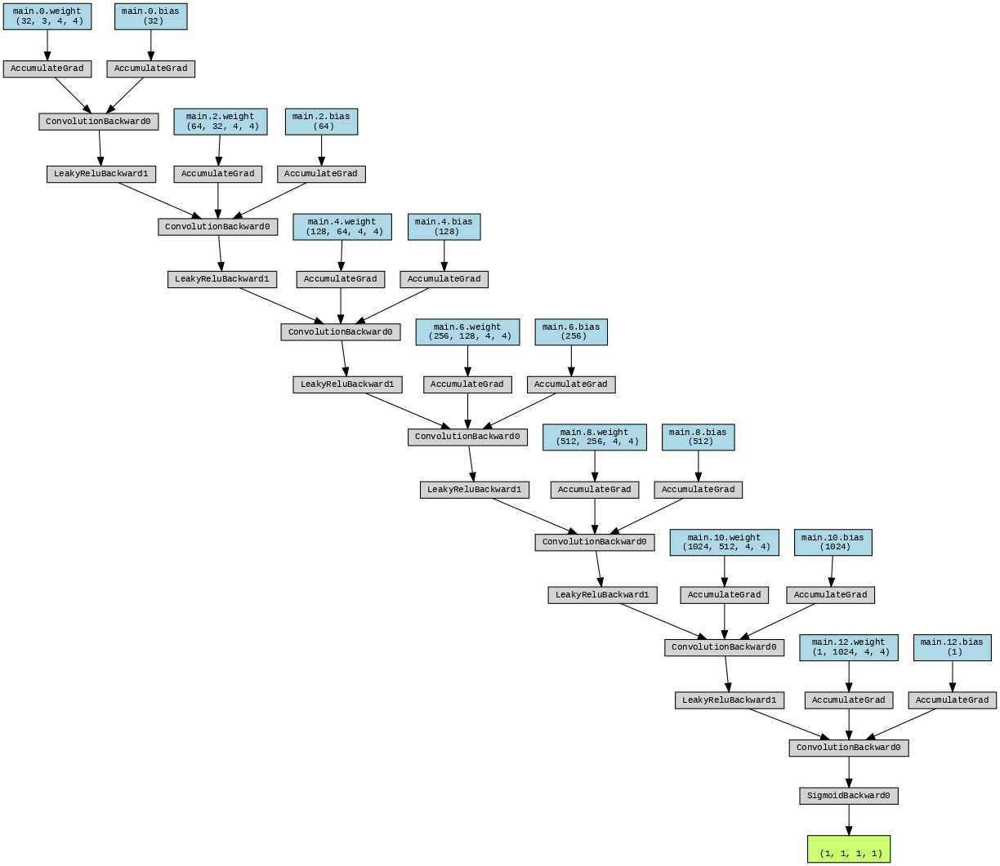
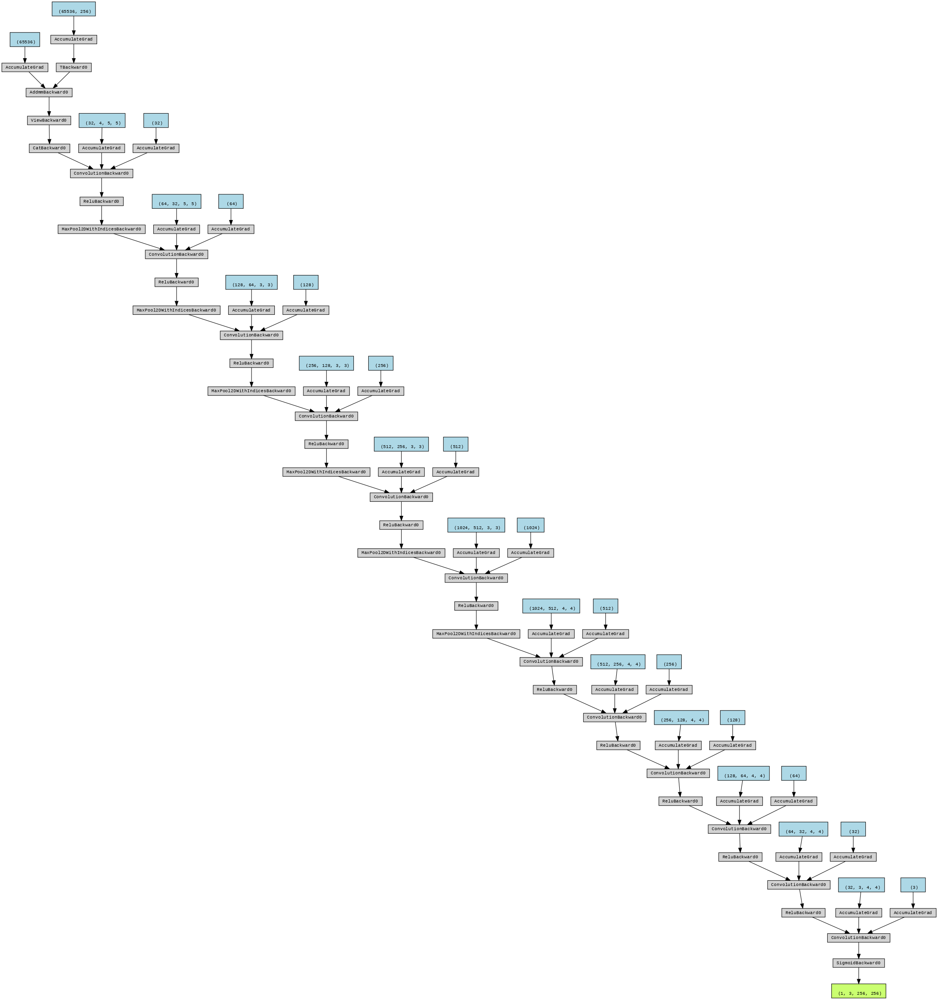

#### U-Net with GAN
Our second approach was to still use GANs but this time the generator had U-NET like structure. It was not the original U-NET but our own architecture inspired by it. We used less layers to have less parameters but the idea is the same: first there is a stack of contracting layers followed by the stack of expanding layers with both stacks connected with the residual connections. The discriminator is the stack of convolutional layers followed by the dense layers.

##### Discriminator
![Bez nazwy.png](<attachment:Bez nazwy.png>)

##### Generator
![Bez nazwy-2.png](<attachment:Bez nazwy-2.png>)
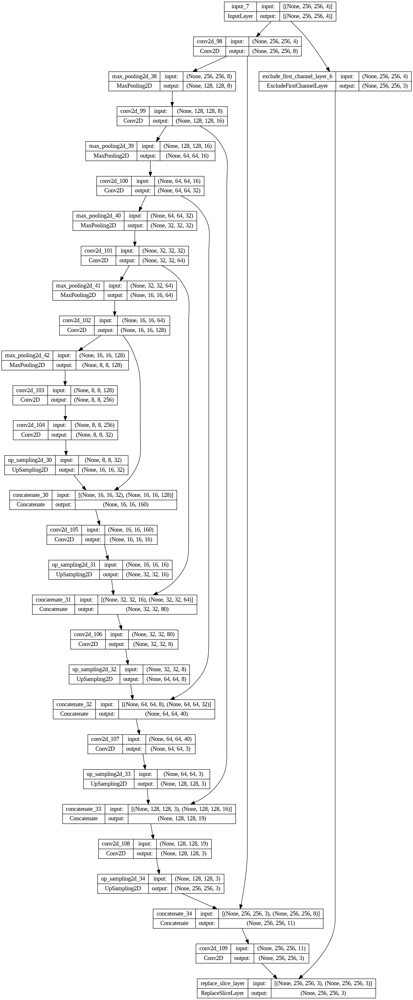
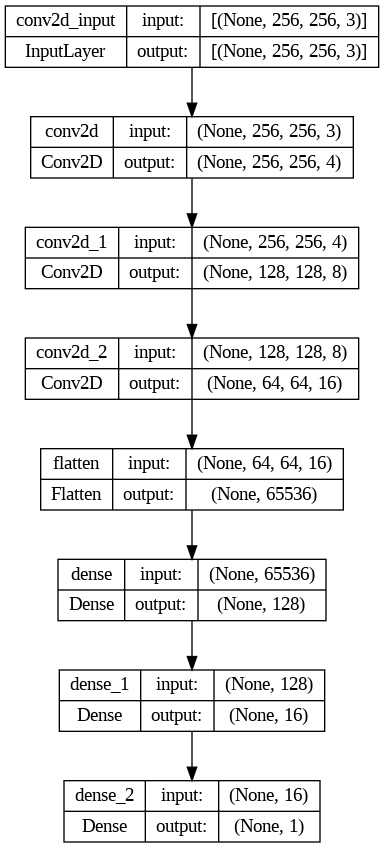

#### Resnet
The generator architecture consists of an initial convolutional layer followed by a sequence of down blocks, residual blocks, and up blocks. The initial layer processes the input with a 7x7 convolution, batch normalization, and ReLU activation. The down blocks reduce spatial dimensions and increase feature channels through convolution, batch normalization, and ReLU activation. The residual blocks introduce skip connections and non-linearity to capture complex patterns. The up blocks reverse the downsampling process, increasing spatial dimensions while decreasing feature channels. Finally, a transposed convolutional layer with batch normalization and a Tanh activation generates the output image. The generator incorporates conditional information through a linear projection of noise, concatenated with the input, and reshaped before processing through the network.

##### Residual Block
![Bez nazwy.png](<attachment:Bez nazwy.png>)
##### Down Block
![Bez nazwy-2.png](<attachment:Bez nazwy-2.png>)
##### Up block
![Bez nazwy-3.png](<attachment:Bez nazwy-3.png>)
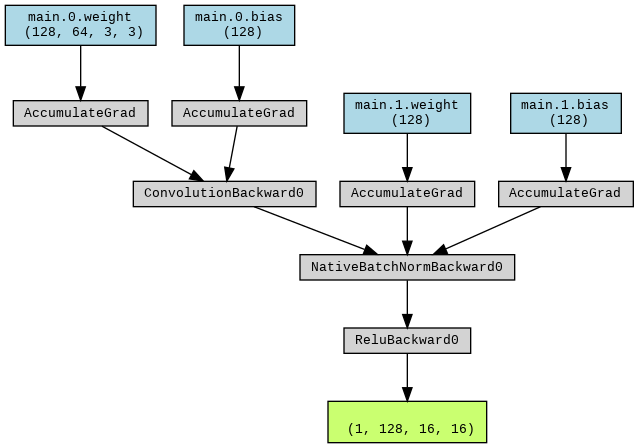
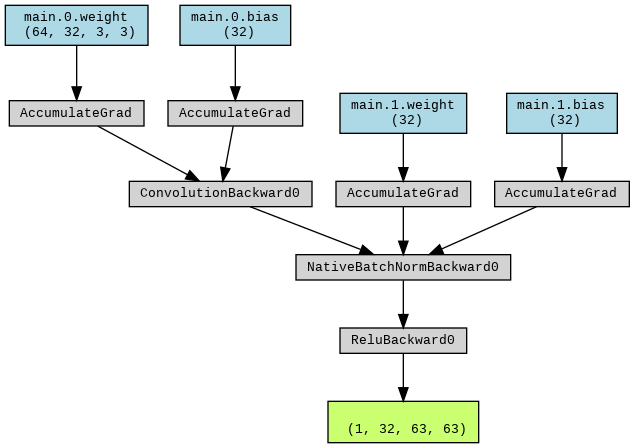
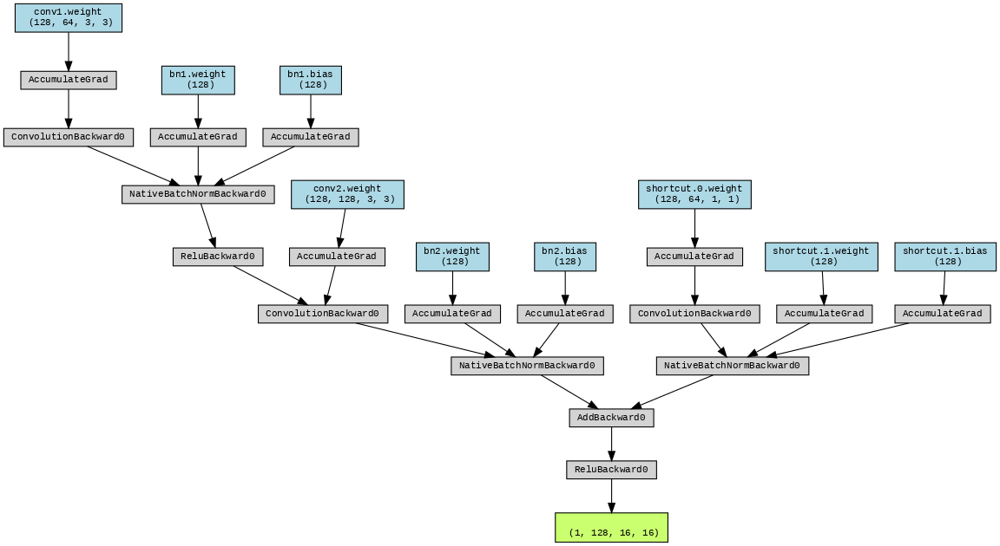

#### VAE
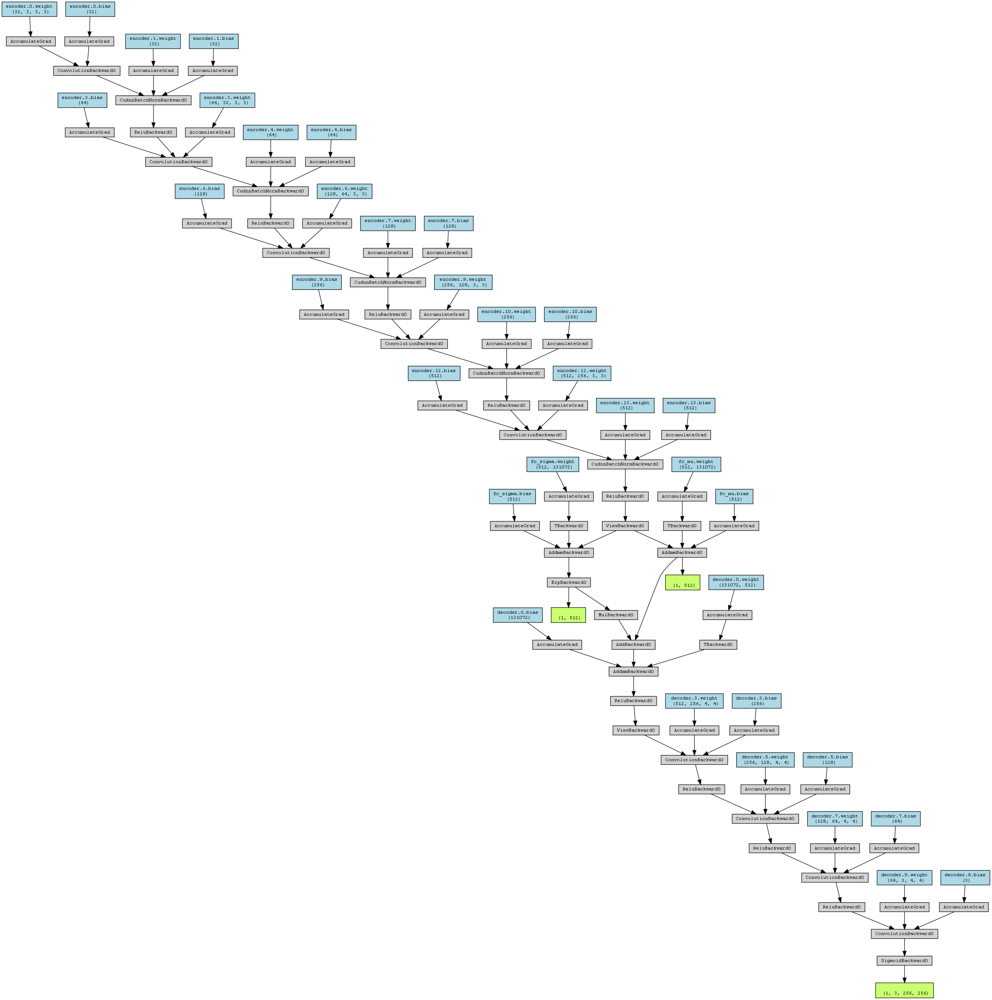

## Number of parameters and memory use

In [1]:
vae = 205785283
resnet = 140646147
gan = 31065575
unet = 498107
simple = 1313139 
unet_m = 1.9
simple_m = 5.01
resnet_m = 536.6
gan_m = 118.5
vae_m = 912.77

In [2]:
import matplotlib.pyplot as plt

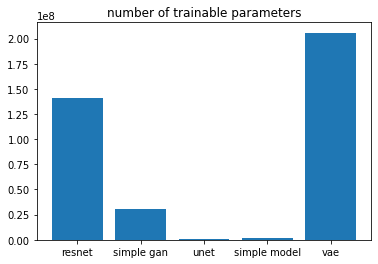

In [3]:
plt.bar(['resnet', 'simple gan', 'unet', 'simple model', 'vae'], [resnet, gan, unet, simple, vae])
plt.title('number of trainable parameters')
plt.show()

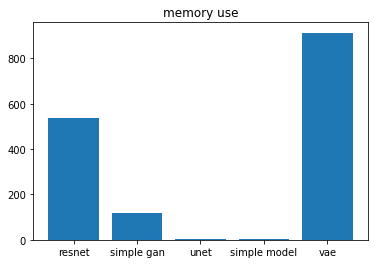

In [4]:
plt.bar(['resnet', 'simple gan', 'unet', 'simple model', 'vae'], [resnet_m, gan_m, unet_m, simple_m, vae_m])
plt.title('memory use')
plt.show()

## Training
To recreate a training process one only needs to run all cells in dedicated jupyter notebook: basic_model.inpynb, GAN.ipynb, U-NET.ipynb, resnet.ipynb, vae.ipynb.

#### simple model
The training process of the simple model was a regular regression task where the model tried to minimize the L2 error from the ground truth using stochastic gradient descent.

#### GAN-based architectures
In each epoch, the discriminator is trained to distinguish between real images and those with the generator's output. The generator concurrently aims to deceive the discriminator by producing images that the discriminator perceives as real. The training process involves alternating updates between the discriminator and generator, optimizing their respective parameters using the binary cross-entropy loss.

#### VAE
For each batch a hole is created in the input images. The VAE's parameters are optimized using the Adam optimizer with a binary cross-entropy loss for image reconstruction and a KL divergence term, measuring the divergence between the learned latent distribution and a predefined normal distribution. Binary Cross-Entropy (BCE) loss in a Variational Autoencoder (VAE) measures the pixel-wise difference between the reconstructed image and the input image, guiding the model to accurately replicate the input during training. KL Divergence in a VAE quantifies the difference between the learned latent distribution and a predefined normal distribution, allowing the VAE to form a meaningful latent space during optimization

### Metrics


#### training

##### L2 loss
Euclidean distance measured between each pixel of the predicted and real image.

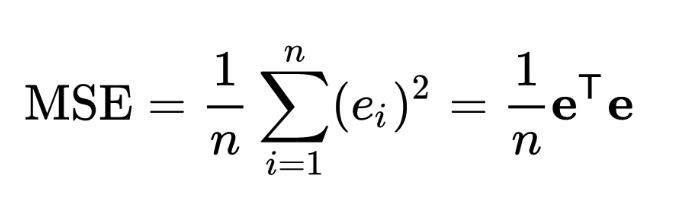

##### adversarial loss
Used in GAN training where the loss represents how well the discriminator can distinguish real images from fakes. Is based on binary cross-entropy. Discriminator tries to minimize it while generator tries to maximize it.

![1 EWtJ8s71tKvef0xGw4s-RA.webp](<attachment:1 EWtJ8s71tKvef0xGw4s-RA.webp>)

##### KL divergence
Measures the distance between two distributions. Was used in the process of the VAE training.

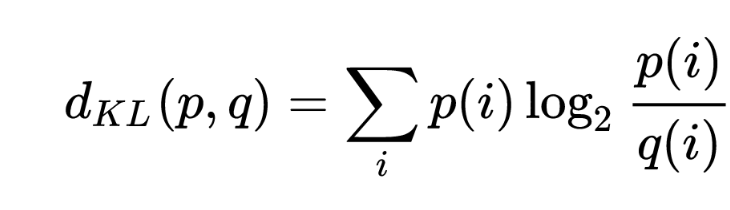

##### Binary crossentropy
Was used in to compare the output of the VAE with the ground truth.

![1 rdBw0E-My8Gu3f_BOB6GMA-3615523901.png](<attachment:1 rdBw0E-My8Gu3f_BOB6GMA-3615523901.png>)



#### Validation 

##### L2 loss
Euclidean distance measured between each pixel of the predicted and real image.

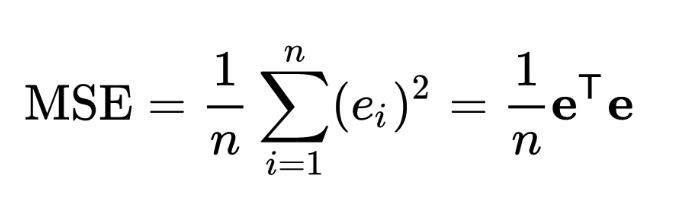

##### Structural similarity index
Was used as the validation method to compare the quality of the results obtained by different generators. Takes into account mean and variation of pixels.

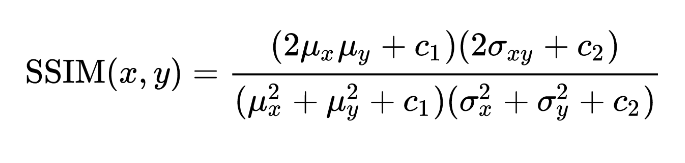
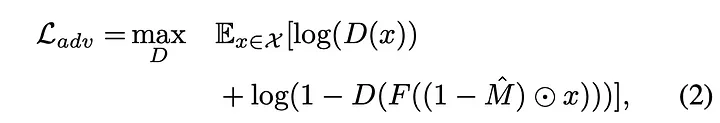
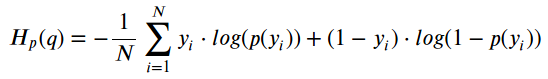

## Validation

In [5]:
gan_ssim = 0.99127245
gan_mse = 0.00038272404
resnet_ssim = 0.99161565
resnet_mse = 0.0004016364
simple_ssim = 0.9837449752923775
simple_mse = 1.6367833137512207
unet_ssim = 0.8887400145601699
unet_mse = 3.4932474772135
vae_ssim= 0.9873587045122629
vae_mse= 28.925259892145785

In [6]:
import matplotlib.pyplot as plt

Text(0.5, 1.0, 'mean squared error on the test set')

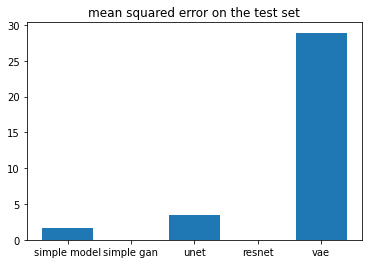

In [7]:
plt.bar(['simple model', 'simple gan', 'unet', 'resnet', 'vae'], [simple_mse, gan_mse, unet_mse, resnet_mse, vae_mse])
plt.title('mean squared error on the test set')

Text(0.5, 1.0, 'structural similarity index on the test set')

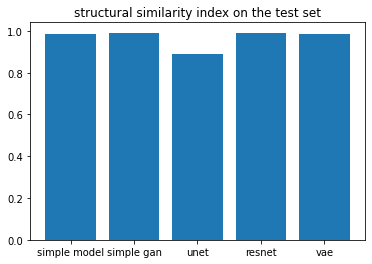

In [9]:
plt.bar(['simple model', 'simple gan', 'unet', 'resnet', 'vae'], [simple_ssim, gan_ssim, unet_ssim, resnet_ssim, vae_ssim])
plt.title('structural similarity index on the test set')

simple

![Bez nazwy.png](<attachment:Bez nazwy.png>)

gan

![Bez nazwy.jpg](<attachment:Bez nazwy.jpg>)

unet
![Bez nazwy-2.png](<attachment:Bez nazwy-2.png>)

resnet

![Bez nazwy-2.jpg](<attachment:Bez nazwy-2.jpg>)
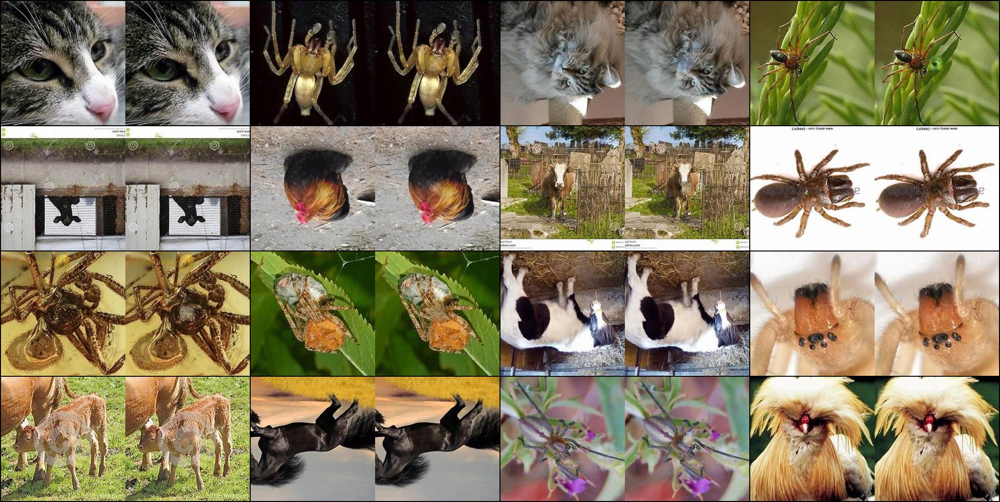
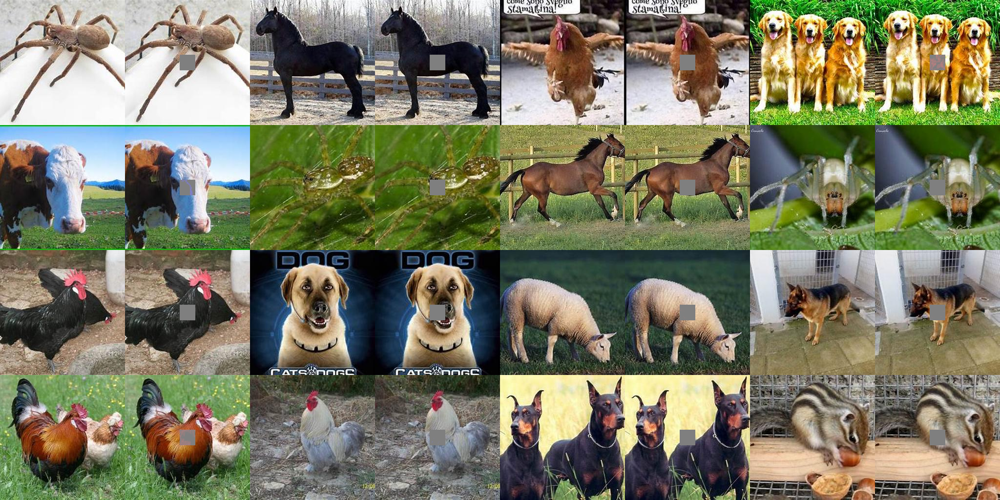
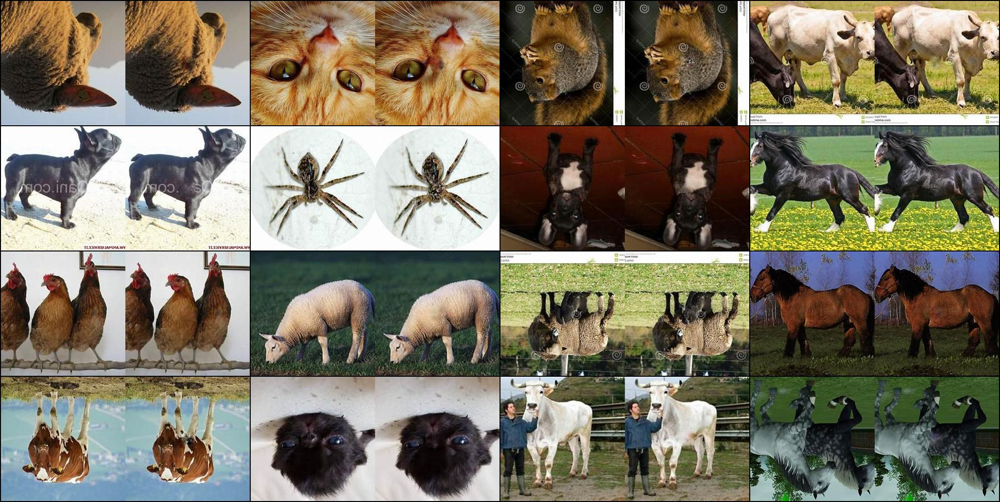
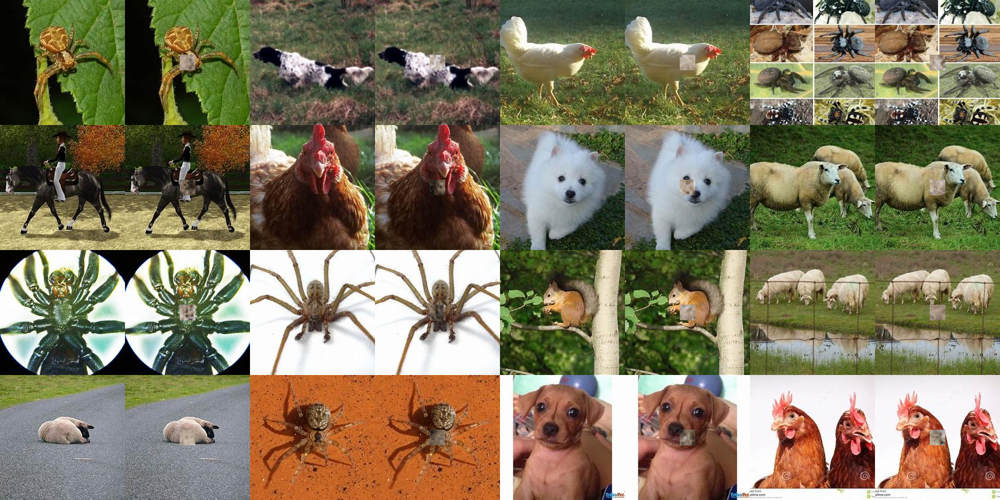

#### vae
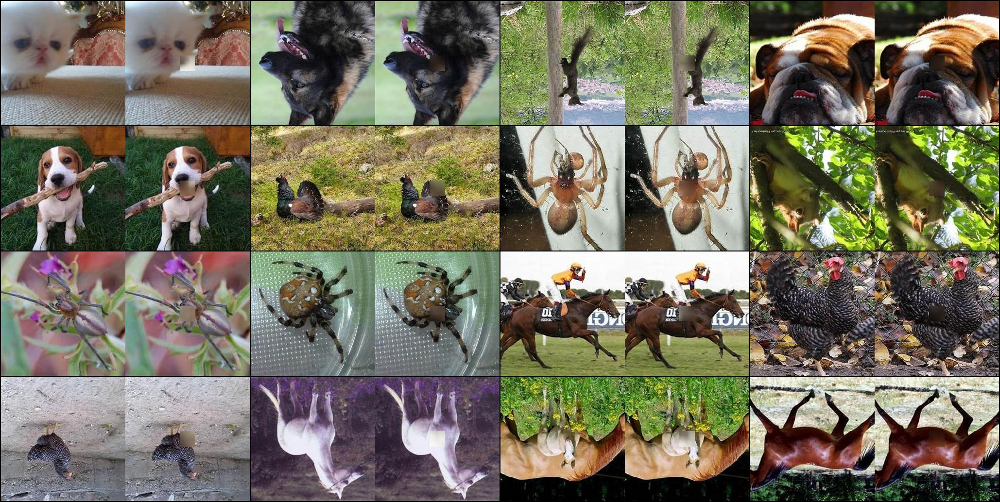

## Chosen hyperparameters

* Z_DIM = 256: Represents the dimensionality of the latent space, must be the same size as image size
* BETA_1 = 0.5 and BETA_2 = 0.999: Parameters for the Adam optimizer, controlling the exponential decay rates of the moment estimates. Chosen based on literature
* LEARNING_RATE = 1e-4: Specifies the step size for updating model parameters during optimization. Chosen based on literature.
* FEATURES_D = 32 and FEATURES_G = 32: Represent the number of features in the discriminator and generator networks. Were initially chosen to be the same as the size of the generated patch
* PATCH_SIZE = 32: The size of the inpainted patch. Was chosen like this to speed up the training process.

* LATENT_DIM = 512: Represents the dimensionality of the latent representation. Allows vae to capture more information about the data. was chosen based on literature

## Conclusions
We can see that some of the models solve the problem much better than the others. In general for some it is hard to distinguish the original from the restored one at the first sight. The simple model is not doing very well. The filled parts are blurry and grayish. However the model was not expected to do any better and was generally a reference point for the further experiments. It is still surprising that with L2 loss only it was still able to predict a texture on the unseen test examples. 

Vae images are very blurry, although they do have some correct colors and textures. The blurriness is probably caused by insufficient size of latent representation, although trial of latend dim = 1024 ended with estimated training time per batch to be about 3 hours. Another thing that might be the reason for blurriness is the fact that there is KL loss and BCE loss in training, and if the model prioritizes the kl loss the image gets blurry. 

The worst performing model was definitely the U-NET. We had a lot of problems with training it. The training process took a lot of time and both the generator and the discriminator had problems to learn. There were situations were for many batches the whole system was stagnated. The loss of both discriminator and generator had to be constantly monitored and only when one of those drop below the certain point the other could start to learn otherwise one of them would get stuck and not learn at all.

The best performing methods were definitely GAN with the autoencoder architecture and resnet architecture. Both of them produced realistic looking images with high structural similarity index values. Some of the samples can have some visible distortions but the overall performance must be evaluated as satisfactional. 

## Tools and libraries
### Tools
* DVC
* GIT
* Google drive connected to DVC

### Libraries
* tensorflow
* torch
* torchvision
* numpy
* cv2
* matplotlib
* Pillow
* tqdm

| element | points |
| ---- | ---|
| Image inpainting problem | 3 |
| Use of DVC | 2 |
| 10 000+ example dataset | 1 | 
| simple model (own architecture) | 2 |
| GAN architecture from github trained from scratch | 2 |
| U-NET inspired own architecture with GAN | 3 |
| resnet from paper with GAN | 2 |
| VAE own architecture | 2 |
| **summary** | **17** |

## Image source
1. https://en.wikipedia.org/wiki/Structural_similarity
2. https://en.wikipedia.org/wiki/Kullback%E2%80%93Leibler_divergence
3. https://en.wikipedia.org/wiki/Mean_squared_error

## Bibliography
1. https://medium.com/analytics-vidhya/introduction-to-generative-models-for-image-inpainting-and-review-context-encoders-13e48df30244
2. https://towardsdatascience.com/a-breakthrough-in-deep-image-inpainting-review-generative-image-inpainting-with-contextual-1099c195f3f0
3. https://towardsdatascience.com/10-papers-you-must-read-for-deep-image-inpainting-2e41c589ced0
4. https://github.com/hkproj/pytorch-ddpm
5. https://docs.google.com/presentation/d/146p-nLNbDF2EQgObc0I0rJcMTRCIlugVvHZvo8Z1cYI/edit
6. https://github.com/fqhd/Inpainting
